   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.2/1.2 MB 38.0 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 94.6/94.6 kB 11.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 66.8/66.8 kB 7.4 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 49.9/49.9 MB 20.8 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.5/1.5 MB 67.1 MB/s eta 0:00:00
   ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 5.5/5.5 MB 118.0 MB/s eta 0:00:00


Saving food detect.v21-more_images_added_new2.yolov8.zip to food detect.v21-more_images_added_new2.yolov8.zip
Dataset ready at: food detect.v21-more_images_added_new2.yolov8
Creating new Ultralytics Settings v0.0.6 file ✅ 
View Ultralytics Settings with 'yolo settings' or at '/root/.config/Ultralytics/settings.json'
Update Settings with 'yolo settings key=value', i.e. 'yolo settings runs_dir=path/to/dir'. For help see https://docs.ultralytics.com/quickstart/#ultralytics-settings.
Ultralytics 8.4.19 🚀 Python-3.12.12 torch-2.10.0+cu128 CUDA:0 (Tesla T4, 14913MiB)
engine/trainer: agnostic_nms=False, amp=True, angle=1.0, augment=False, auto_augment=randaugment, batch=4, bgr=0.0, box=7.5, cache=False, cfg=None, classes=None, close_mosaic=10, cls=0.5, compile=False, conf=None, copy_paste=0.0, copy_paste_mode=flip, cos_lr=False, cutmix=0.0, data=food detect.v21-more_images_added_new2.yolov8/data.yaml, degrees=0.0, deterministic=True, device=0, dfl=1.5, dnn=False, dropout=0.0, dynamic=False, e

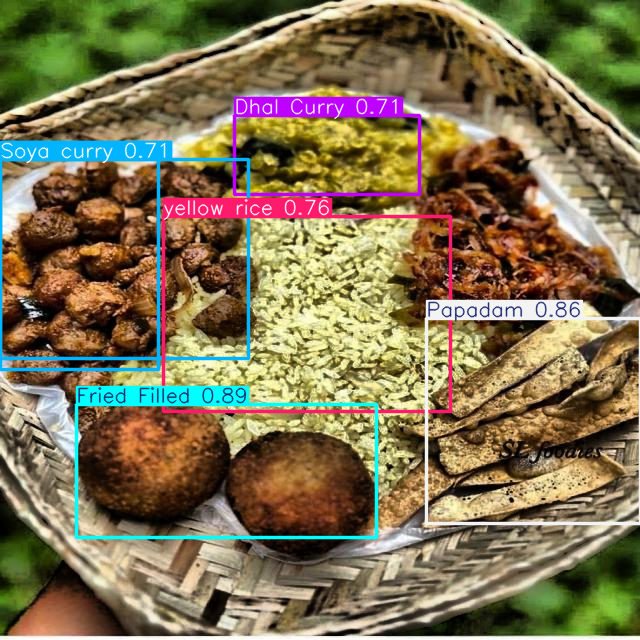

In [1]:
# Step 0: Install packages
!pip install ultralytics roboflow --quiet

# Step 1: Upload your dataset ZIP
from google.colab import files
uploaded = files.upload()  # choose your ZIP file

# Step 2: Unzip the dataset
import zipfile
import os
for fn in uploaded.keys():
    with zipfile.ZipFile(fn, 'r') as zip_ref:
        zip_ref.extractall(fn.replace(".zip",""))

dataset_path = fn.replace(".zip","")
print("Dataset ready at:", dataset_path)

# Step 3: Train a small YOLOv8 model quickly
from ultralytics import YOLO

# Use yolov8n.pt (nano) for very fast training
model = YOLO("yolov8s.pt")

# Quick training settings for testing
model.train(
    data=f"{dataset_path}/data.yaml",  # path to data.yaml
    epochs=40,                          # small number of epochs for fast start
    imgsz=640,                         # smaller images to speed up
    batch=4,                            # smaller batch for Colab free
    project="meal_plate_test",          # save results here
    name="quick_train",
    exist_ok=True,
    device=0
)

# Step 4: Test on one example image
example_image = os.path.join(dataset_path, "valid/images", os.listdir(os.path.join(dataset_path, "valid/images"))[0])
results = model.predict(example_image)
results[0].show()  # show the first (and only) result



Testing on: n9_jpg.rf.05252b3c2be32a50c262bf8c68989b65.jpg

image 1/1 /content/food detect.v21-more_images_added_new2.yolov8/valid/images/n9_jpg.rf.05252b3c2be32a50c262bf8c68989b65.jpg: 640x640 1 Cashew Curry, 1 Chicken curry, 2 Fried Filleds, 1 Mango curry, 1 Pol Sambol, 1 Polos curry, 1 yellow rice, 16.4ms
Speed: 2.3ms preprocess, 16.4ms inference, 3.9ms postprocess per image at shape (1, 3, 640, 640)


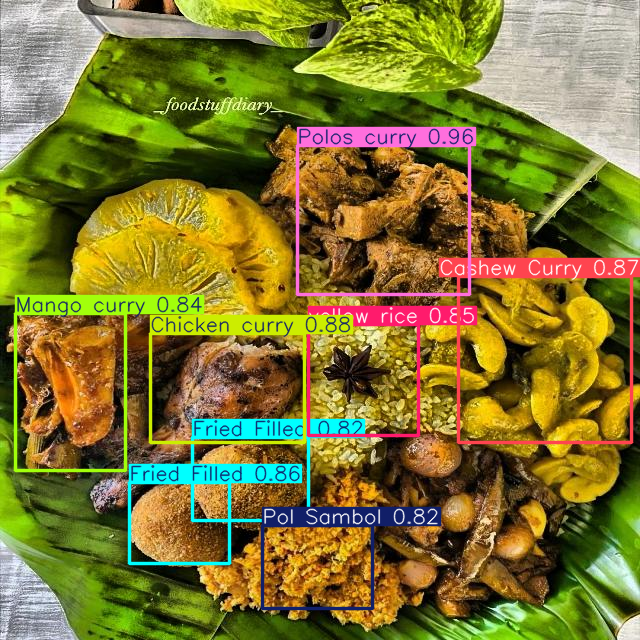

In [2]:
import random
import os

# Pick a random image from your validation set
valid_images_dir = os.path.join(dataset_path, "valid/images")
random_image = random.choice(os.listdir(valid_images_dir))
example_image = os.path.join(valid_images_dir, random_image)

print("Testing on:", random_image)
results = model.predict(example_image)
results[0].show()


Upload new meal plate images (you can select multiple):


Saving tn4.PNG to tn4.PNG
Saving tnew.webp to tnew.webp
Saving tnew2.webp to tnew2.webp
Saving tnew3.jpg to tnew3.jpg
Saving tnew4.jpg to tnew4.jpg
Saving tnew5.jpg to tnew5.jpg
Saving tnew6.jpg to tnew6.jpg
Saving tnew7.jpeg to tnew7.jpeg
8 image(s) uploaded for testing.

--- Testing: new_food_images/tn4.PNG ---

image 1/1 /content/new_food_images/tn4.PNG: 512x640 1 Cocount roti, 1 Lunu sambol, 44.2ms
Speed: 1.9ms preprocess, 44.2ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)

image 1/1 /content/new_food_images/tn4.PNG: 512x640 1 Cocount roti, 1 Lunu sambol, 12.9ms
Speed: 1.8ms preprocess, 12.9ms inference, 1.1ms postprocess per image at shape (1, 3, 512, 640)


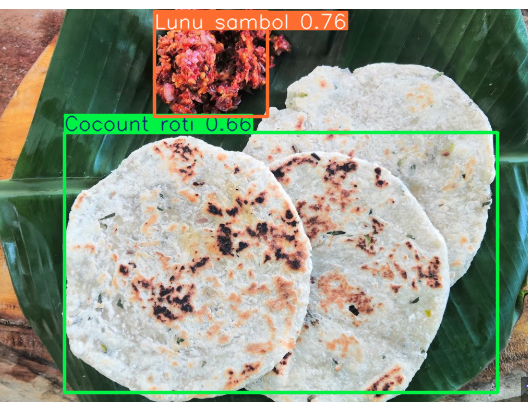

Detected foods:
  - Lunu sambol, Confidence: 0.76
  - Cocount roti, Confidence: 0.66

--- Testing: new_food_images/tnew.webp ---

image 1/1 /content/new_food_images/tnew.webp: 640x640 1 Beans curry, 1 Beetroot Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 Potato Curry, 1 Sprats, 1 rice, 17.2ms
Speed: 3.9ms preprocess, 17.2ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/new_food_images/tnew.webp: 640x640 1 Beans curry, 1 Beetroot Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 Potato Curry, 1 Sprats, 1 rice, 16.2ms
Speed: 2.4ms preprocess, 16.2ms inference, 1.2ms postprocess per image at shape (1, 3, 640, 640)


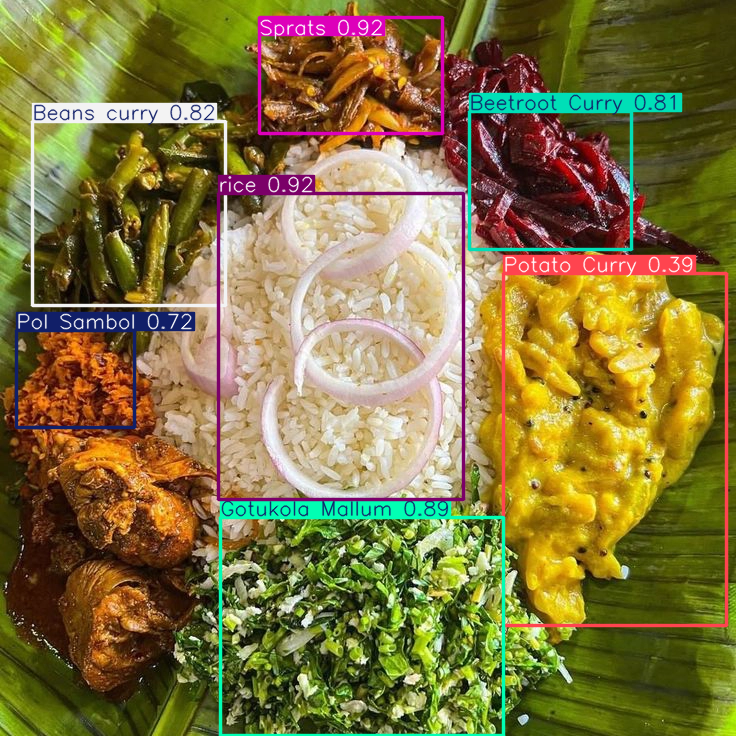

Detected foods:
  - Sprats, Confidence: 0.92
  - rice, Confidence: 0.92
  - Gotukola Mallum, Confidence: 0.89
  - Beans curry, Confidence: 0.82
  - Beetroot Curry, Confidence: 0.81
  - Pol Sambol, Confidence: 0.72
  - Potato Curry, Confidence: 0.39

--- Testing: new_food_images/tnew2.webp ---

image 1/1 /content/new_food_images/tnew2.webp: 448x640 1 Beans curry, 1 Chicken curry, 1 Papadam, 1 Potato Curry, 1 rice, 13.8ms
Speed: 3.5ms preprocess, 13.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew2.webp: 448x640 1 Beans curry, 1 Chicken curry, 1 Papadam, 1 Potato Curry, 1 rice, 12.7ms
Speed: 3.3ms preprocess, 12.7ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


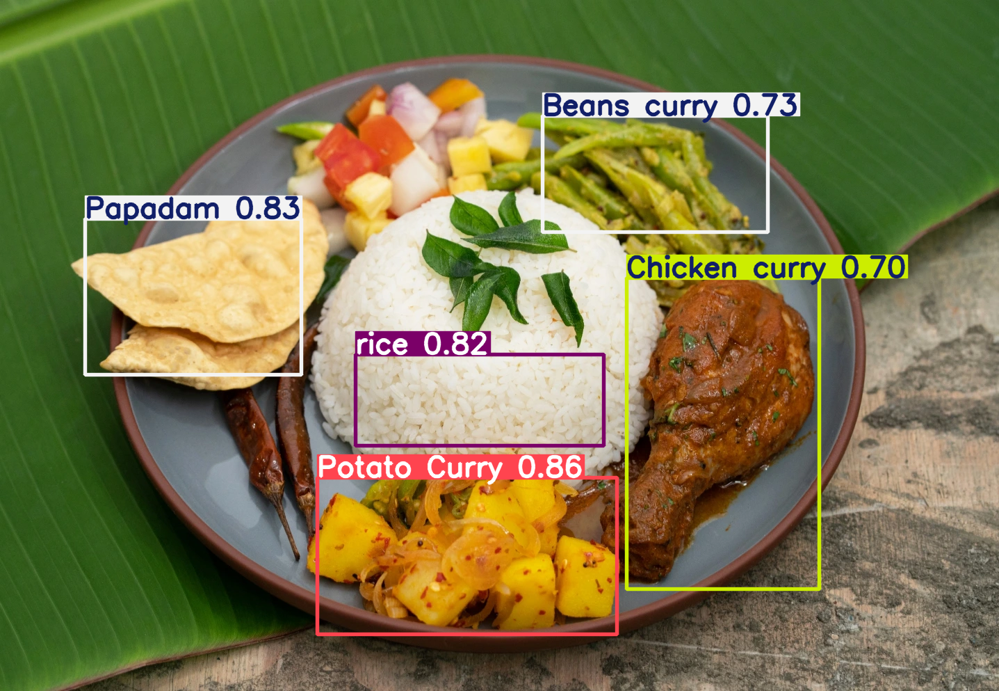

Detected foods:
  - Potato Curry, Confidence: 0.86
  - Papadam, Confidence: 0.83
  - rice, Confidence: 0.82
  - Beans curry, Confidence: 0.73
  - Chicken curry, Confidence: 0.70

--- Testing: new_food_images/tnew3.jpg ---

image 1/1 /content/new_food_images/tnew3.jpg: 448x640 1 Lunu sambol, 1 Sweets, 13.0ms
Speed: 3.9ms preprocess, 13.0ms inference, 1.6ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew3.jpg: 448x640 1 Lunu sambol, 1 Sweets, 12.8ms
Speed: 3.8ms preprocess, 12.8ms inference, 1.8ms postprocess per image at shape (1, 3, 448, 640)


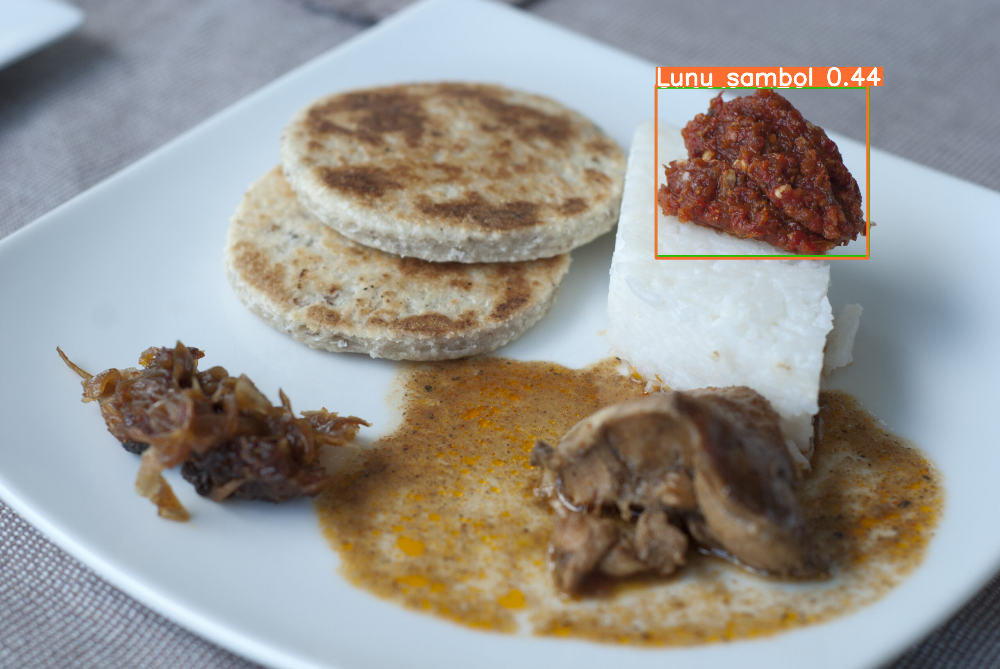

Detected foods:
  - Lunu sambol, Confidence: 0.44
  - Sweets, Confidence: 0.28

--- Testing: new_food_images/tnew4.jpg ---

image 1/1 /content/new_food_images/tnew4.jpg: 384x640 1 Dhal Curry, 1 Gotukola Mallum, 1 Pol Sambol, 89.7ms
Speed: 3.0ms preprocess, 89.7ms inference, 3.4ms postprocess per image at shape (1, 3, 384, 640)

image 1/1 /content/new_food_images/tnew4.jpg: 384x640 1 Dhal Curry, 1 Gotukola Mallum, 1 Pol Sambol, 10.7ms
Speed: 2.7ms preprocess, 10.7ms inference, 1.5ms postprocess per image at shape (1, 3, 384, 640)


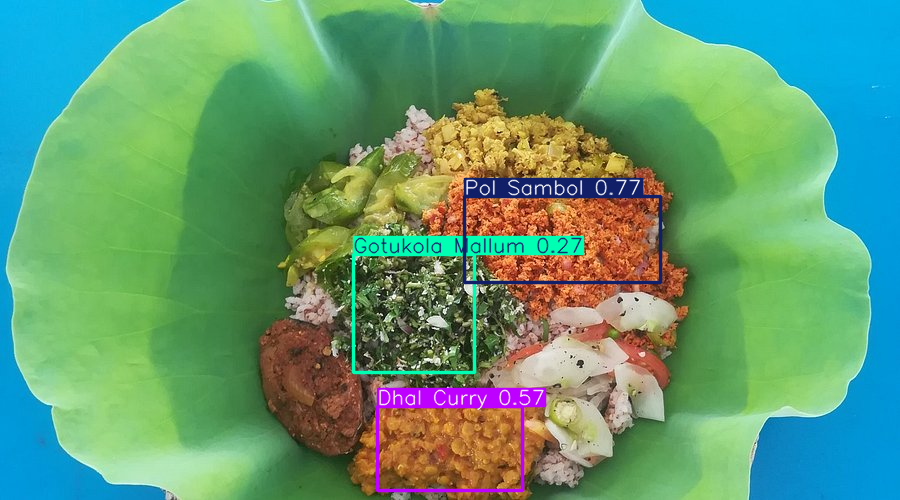

Detected foods:
  - Pol Sambol, Confidence: 0.77
  - Dhal Curry, Confidence: 0.57
  - Gotukola Mallum, Confidence: 0.27

--- Testing: new_food_images/tnew5.jpg ---

image 1/1 /content/new_food_images/tnew5.jpg: 448x640 1 Dhal Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 rice, 14.1ms
Speed: 3.1ms preprocess, 14.1ms inference, 2.5ms postprocess per image at shape (1, 3, 448, 640)

image 1/1 /content/new_food_images/tnew5.jpg: 448x640 1 Dhal Curry, 1 Gotukola Mallum, 1 Pol Sambol, 1 rice, 12.8ms
Speed: 2.9ms preprocess, 12.8ms inference, 1.5ms postprocess per image at shape (1, 3, 448, 640)


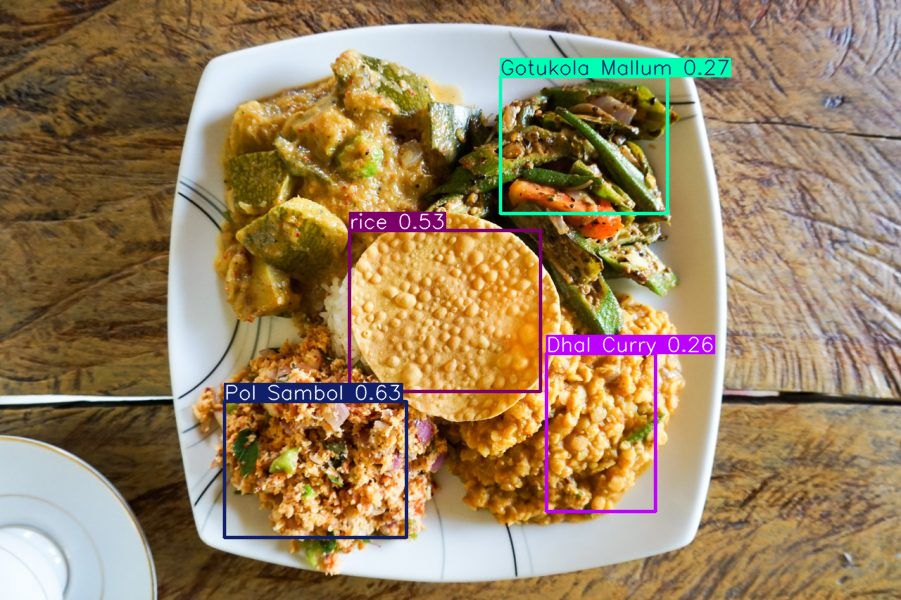

Detected foods:
  - Pol Sambol, Confidence: 0.63
  - rice, Confidence: 0.53
  - Gotukola Mallum, Confidence: 0.27
  - Dhal Curry, Confidence: 0.26

--- Testing: new_food_images/tnew6.jpg ---

image 1/1 /content/new_food_images/tnew6.jpg: 640x640 4 Gotukola Mallums, 1 Potato Curry, 1 Red rice, 1 Sweets, 18.0ms
Speed: 3.6ms preprocess, 18.0ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 640)

image 1/1 /content/new_food_images/tnew6.jpg: 640x640 4 Gotukola Mallums, 1 Potato Curry, 1 Red rice, 1 Sweets, 16.3ms
Speed: 3.6ms preprocess, 16.3ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 640)


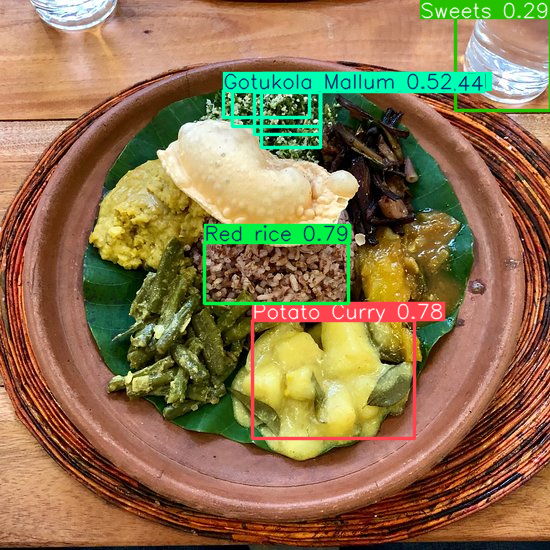

Detected foods:
  - Red rice, Confidence: 0.79
  - Potato Curry, Confidence: 0.78
  - Gotukola Mallum, Confidence: 0.52
  - Gotukola Mallum, Confidence: 0.44
  - Gotukola Mallum, Confidence: 0.39
  - Gotukola Mallum, Confidence: 0.31
  - Sweets, Confidence: 0.29

--- Testing: new_food_images/tnew7.jpeg ---

image 1/1 /content/new_food_images/tnew7.jpeg: 640x480 1 Beetroot Curry, 1 Cashew Curry, 1 Papadam, 1 Pol Sambol, 1 rice, 13.4ms
Speed: 3.9ms preprocess, 13.4ms inference, 1.5ms postprocess per image at shape (1, 3, 640, 480)

image 1/1 /content/new_food_images/tnew7.jpeg: 640x480 1 Beetroot Curry, 1 Cashew Curry, 1 Papadam, 1 Pol Sambol, 1 rice, 12.1ms
Speed: 3.6ms preprocess, 12.1ms inference, 1.7ms postprocess per image at shape (1, 3, 640, 480)


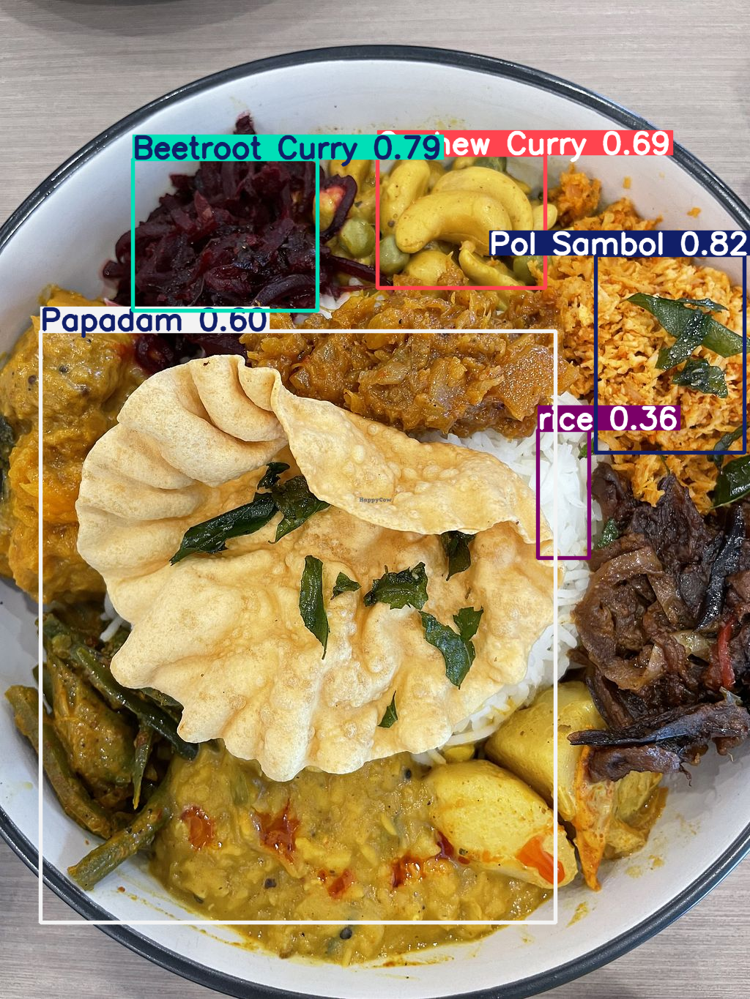

Detected foods:
  - Pol Sambol, Confidence: 0.82
  - Beetroot Curry, Confidence: 0.79
  - Cashew Curry, Confidence: 0.69
  - Papadam, Confidence: 0.60
  - rice, Confidence: 0.36


In [5]:
# ==========================
# Cell 3: Test on new/unseen images
# ==========================

from ultralytics import YOLO
from google.colab import files
import os

# 1️⃣ Load your trained YOLOv8 model
model = YOLO("/content/runs/detect/meal_plate_test/quick_train/weights/best.pt")

# 2️⃣ Upload one or more new images (simulate user uploads)
print("Upload new meal plate images (you can select multiple):")
uploaded = files.upload()  # user selects image files

# 3️⃣ Create a folder to save uploaded images
os.makedirs("new_food_images", exist_ok=True)

# Save uploaded images
uploaded_files = []
for filename in uploaded.keys():
    path = os.path.join("new_food_images", filename)
    uploaded_files.append(path)
    with open(path, "wb") as f:
        f.write(uploaded[filename])
print(f"{len(uploaded_files)} image(s) uploaded for testing.")

# 4️⃣ Run predictions on each uploaded image
for img_path in uploaded_files:
    print("\n--- Testing:", img_path, "---")
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results = model.predict(img_path)  # Run YOLO detection

    # Show the image with bounding boxes
    results[0].show()

    # Print detected foods with confidence scores
    print("Detected foods:")
    for box in results[0].boxes:
        class_id = int(box.cls[0])
        confidence = float(box.conf[0])
        class_name = model.names[class_id]
        print(f"  - {class_name}, Confidence: {confidence:.2f}")
